In [14]:
import torch
import numpy as np
# Download an example image from the pytorch website
import urllib
from PIL import Image as Image 
from torchvision import transforms,datasets
from IPython.display import Image as show_img
import numpy as np
import torchvision
from torch import nn, optim
from torch.nn import functional as F
import pandas as pd
import shap


In [2]:
 class_names = pd.read_csv('labels.csv',index_col = 'id').label.to_list()

In [25]:
device = torch.device("cuda")
model = torch.hub.load('pytorch/vision:v0.4.2', 'mobilenet_v2', pretrained=True)
model = model.to(device)
#model.eval()


Using cache found in C:\Users\fc/.cache\torch\hub\pytorch_vision_v0.4.2


In [5]:
def pill_transf(): 
    transf = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224)
    ])    

    return transf

def preprocess_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])     
    transf = transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])    

    return transf    

def batch_predict(images):
    model.eval()
    batch = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0).to(device)
    #batch =preprocess_transform(images).unsqueeze(0)
    logits = model(batch)
    probs = torch.nn.functional.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

"""

input_tensor = preprocess_transform(pill_transf(input_image))
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

# move the input and model to GPU for speed if available
if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

with torch.no_grad():
    output = model(input_batch)"""

In [26]:
import os

dataset_path = 'imagenet2012'
dataset = torchvision.datasets.ImageFolder('256_ObjectCategories')
imnet_dirs = os.listdir(dataset_path)
#dataset.loader('imagenet2012\\' +imnet_dirs[np.randint(len(imnet_dirs))])

In [12]:
import os
    
x_train = []
y_train = []

rand_idxs = np.random.choice(len(imnet_dirs),120)
for idx,i in enumerate(rand_idxs):
    x_path = imnet_dirs[i]
    x = dataset.loader('imagenet2012\\'+x_path)
    t = torchvision.transforms.functional.to_tensor(pill_transf(x))

    x_train.append(t)


x_train = torch.stack(x_train)
  

In [ ]:
background = x_train[0:50].to(device)
rand_columns = torch.randperm(len(x_train))[:10]
x_test = x_train[rand_columns].to(device)


LAYER NR: 0


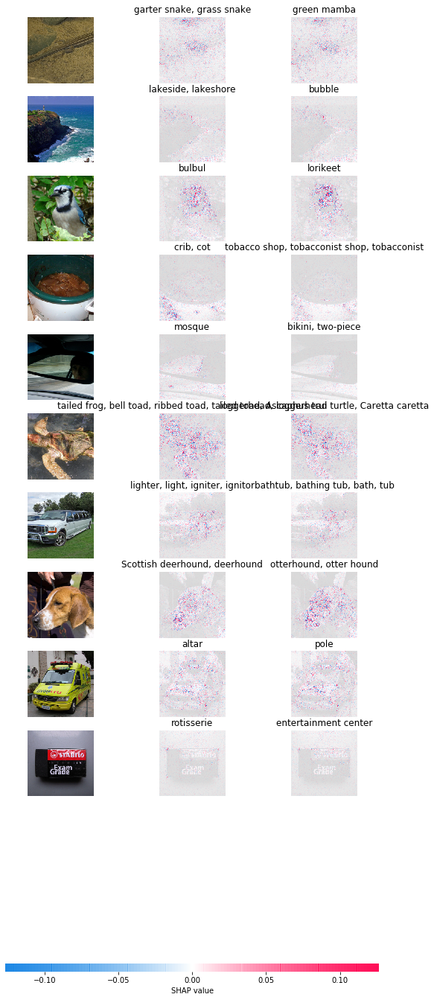

LAYER NR: 1


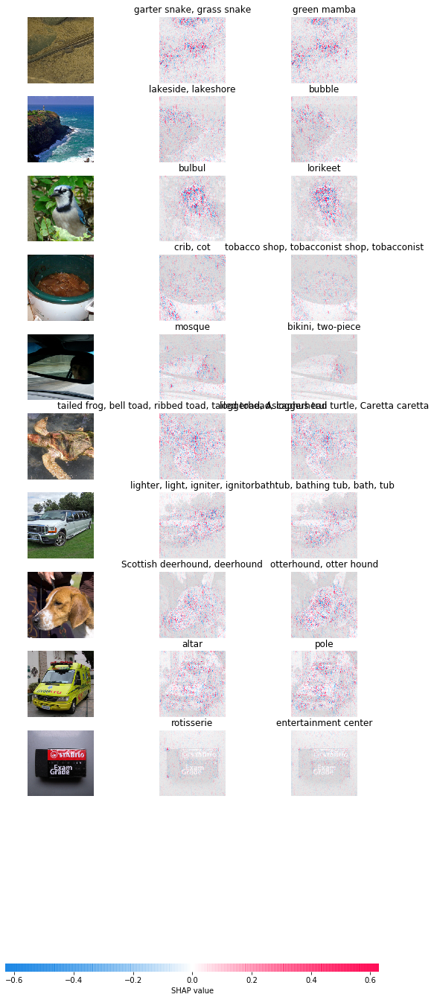

LAYER NR: 2


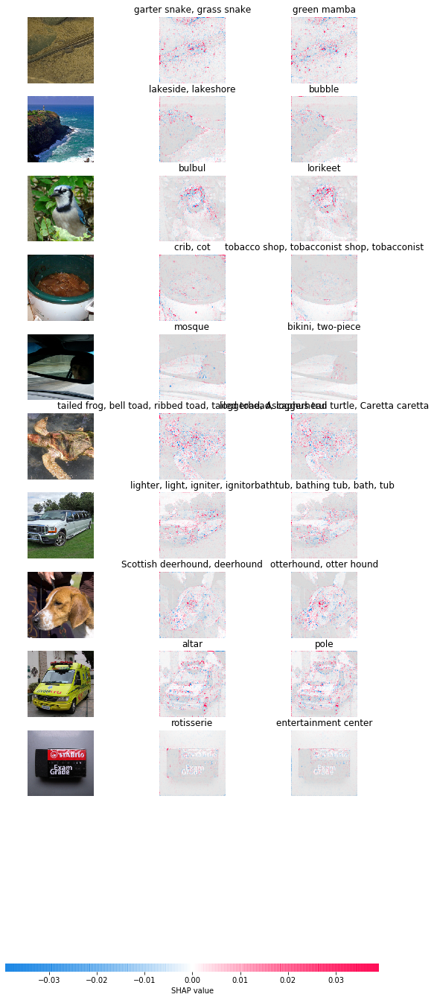

LAYER NR: 3


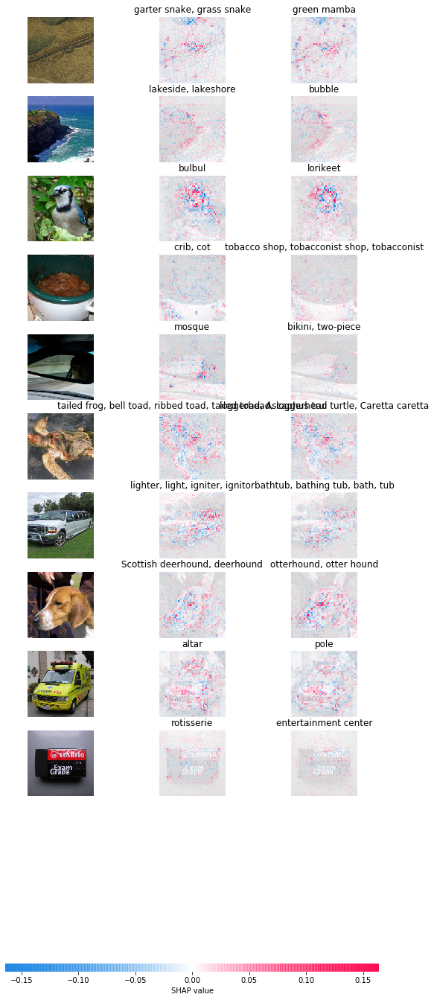

LAYER NR: 4


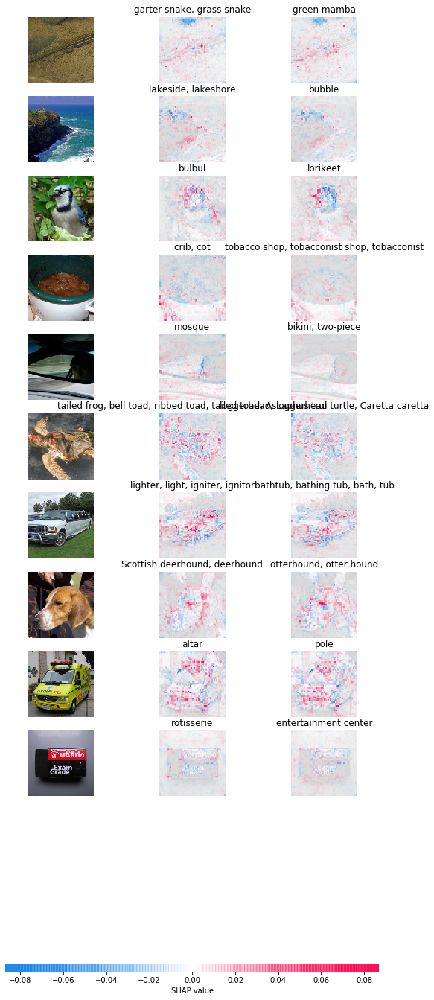

LAYER NR: 5


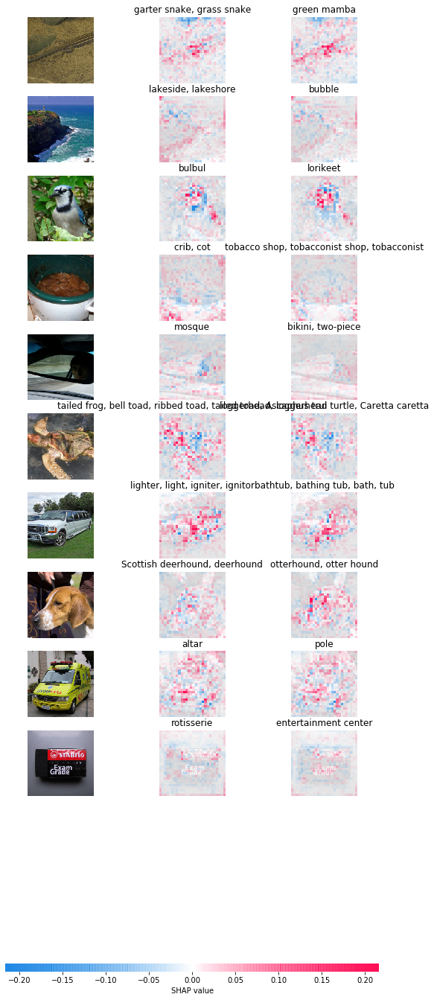

LAYER NR: 6


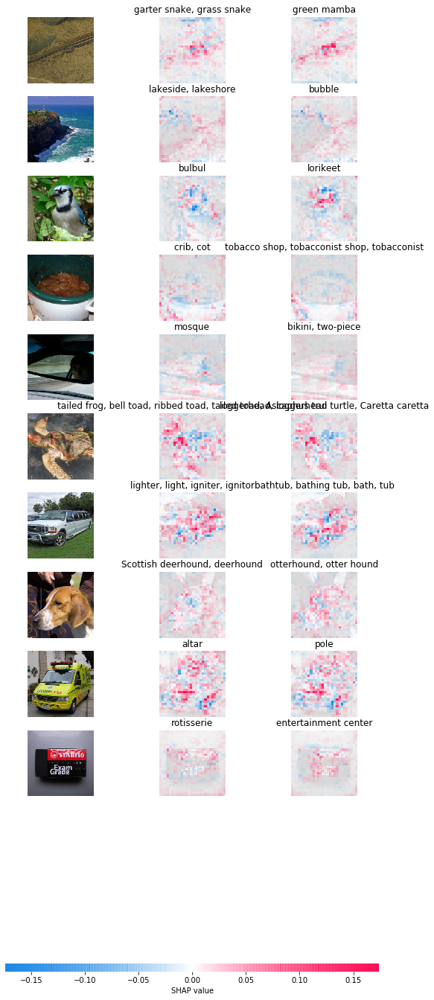

LAYER NR: 7


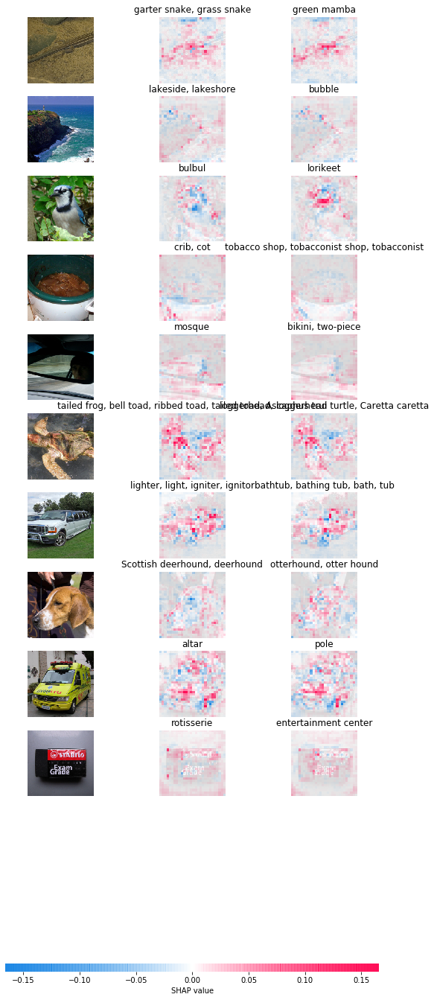

LAYER NR: 8


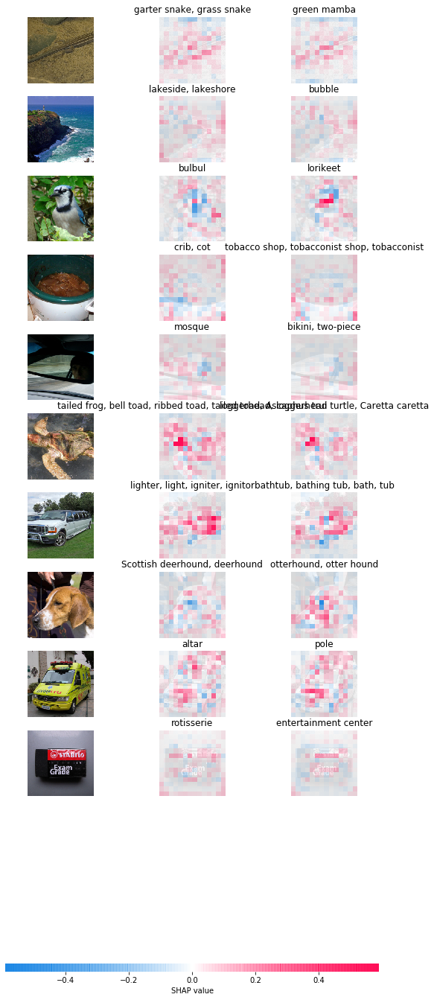

LAYER NR: 9


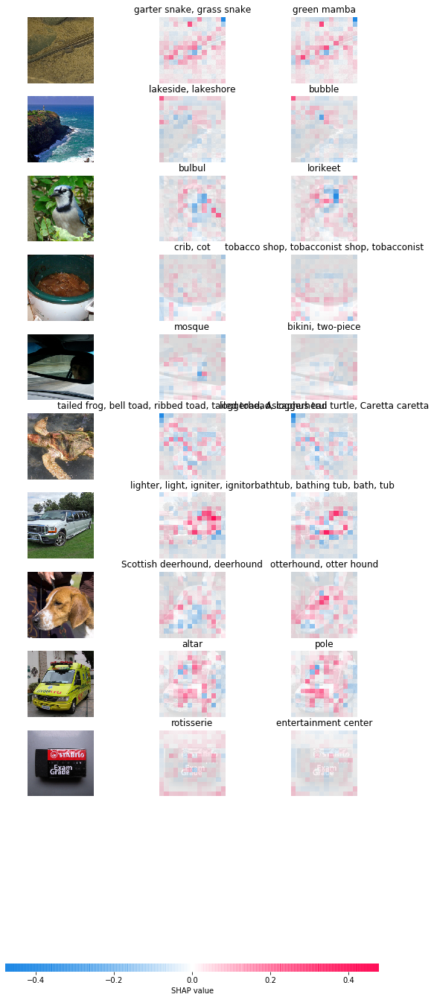

LAYER NR: 10


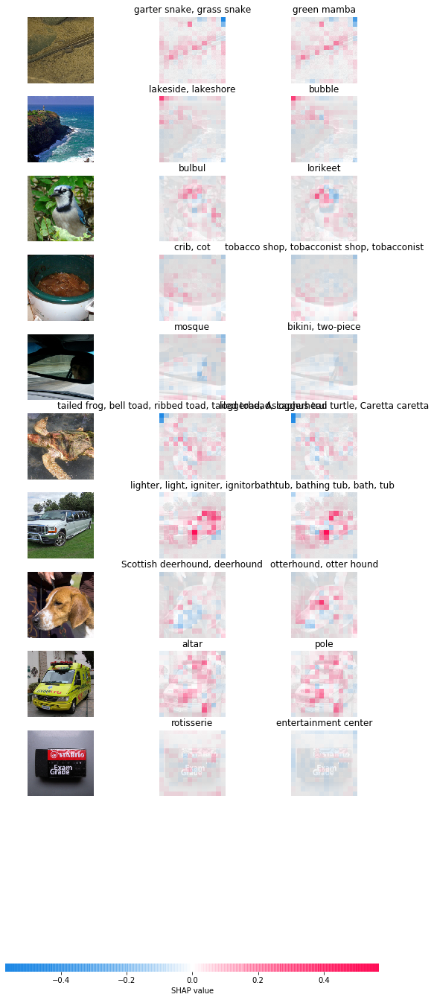

LAYER NR: 11


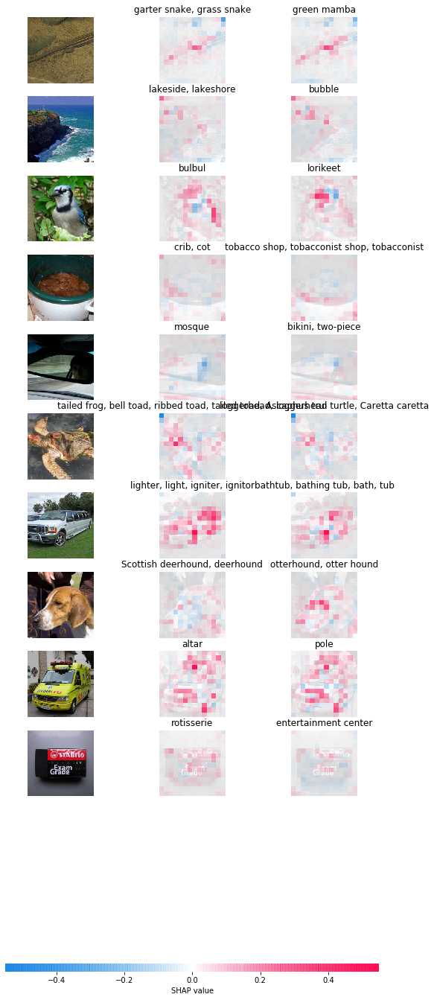

LAYER NR: 12


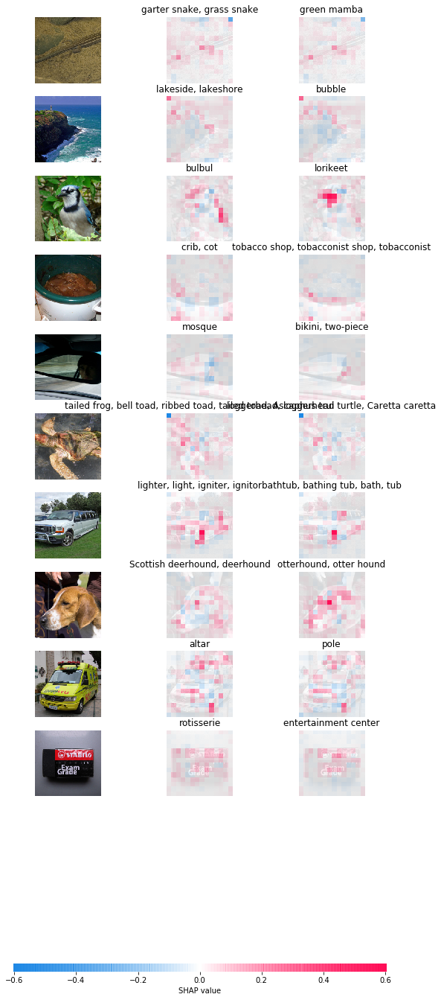

LAYER NR: 13


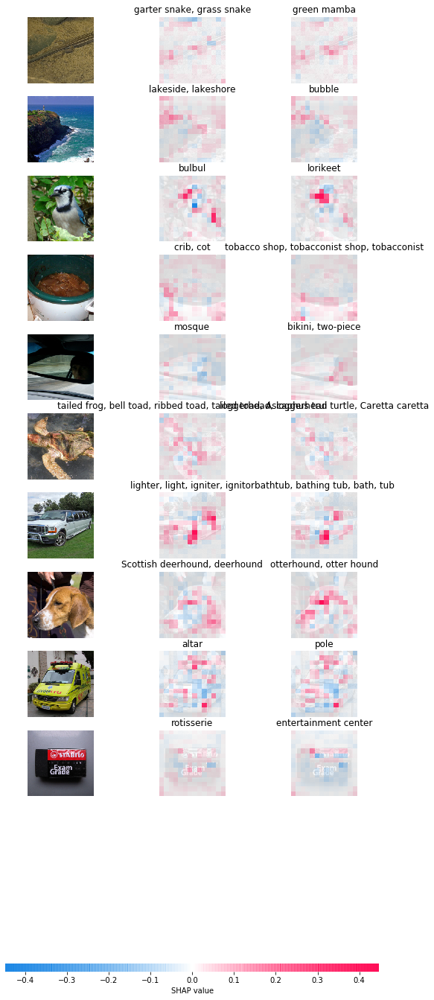

LAYER NR: 14


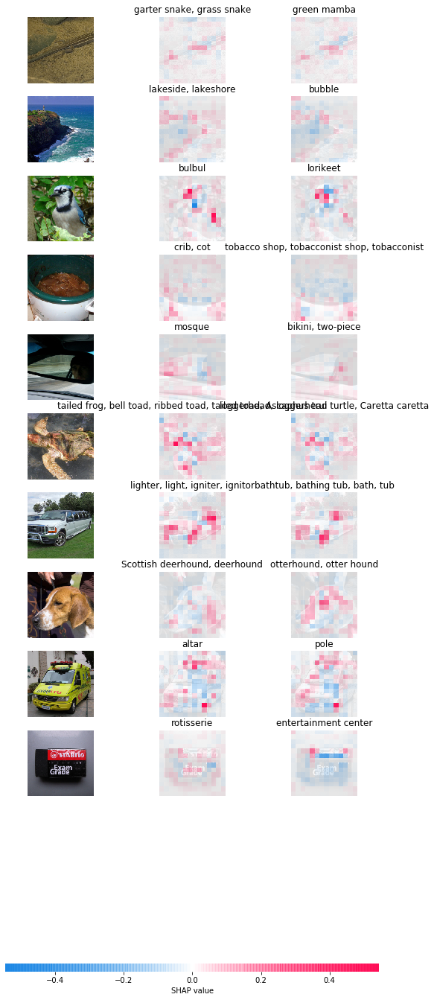

LAYER NR: 15


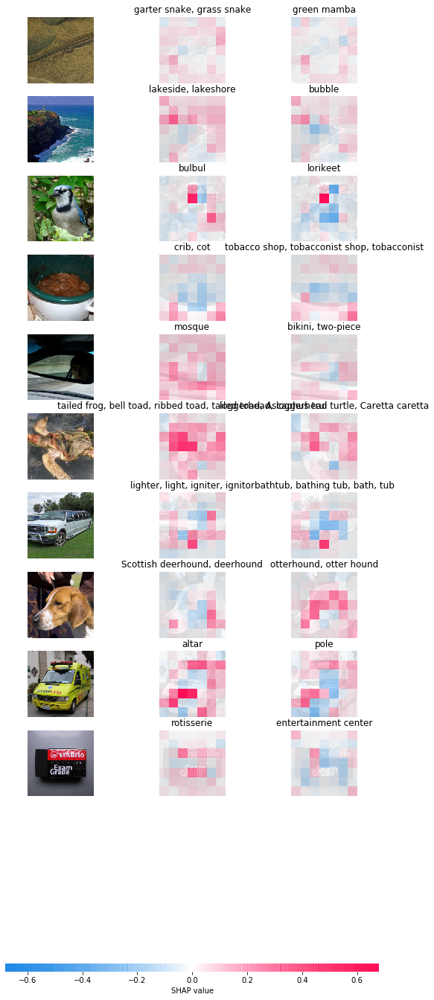

LAYER NR: 16


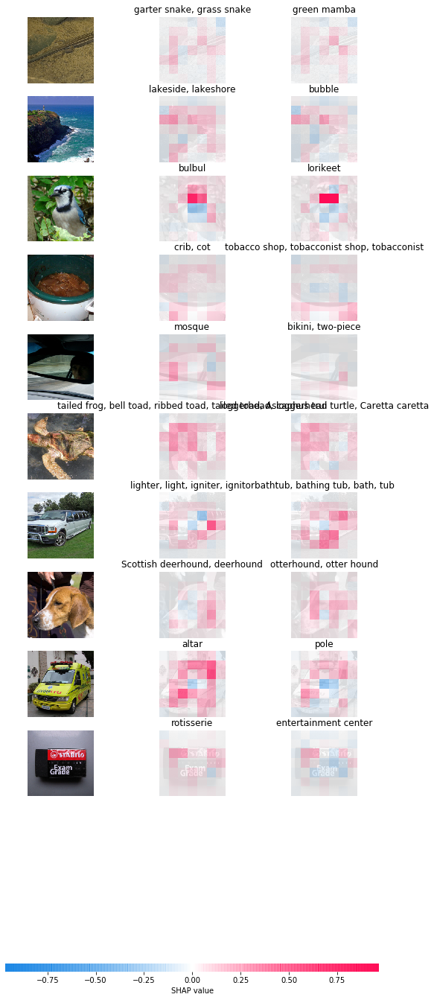

LAYER NR: 17


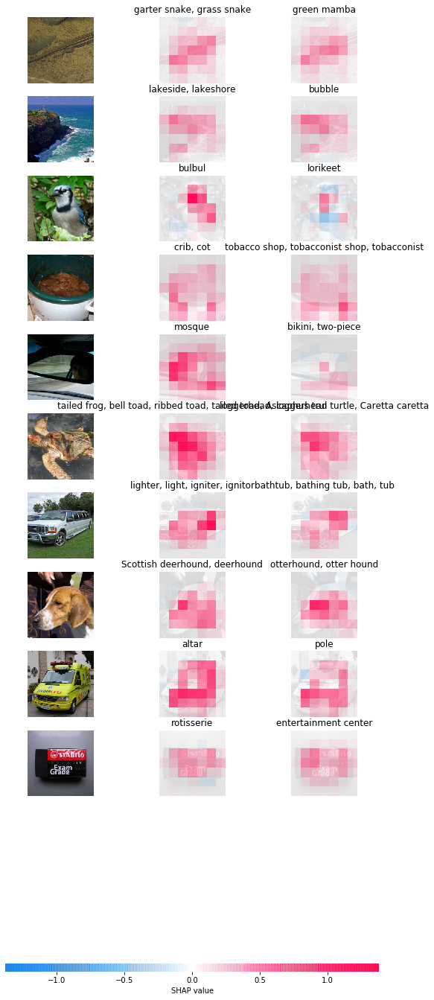

LAYER NR: 18


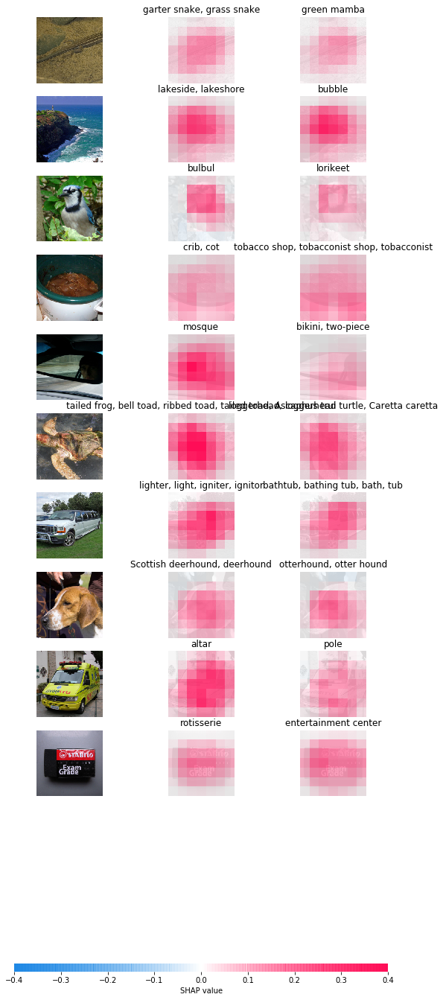

In [24]:
for i in range(len(model.features)):
    print(f"LAYER NR: {i}")
    e = shap.GradientExplainer((model, model.features[i]), background)
    shap_values,indexes = e.shap_values(x_test, ranked_outputs=2, nsamples=200)

    # get the names for the classes
    index_names = np.vectorize(lambda x: class_names[x])(indexes.cpu())


    # plot the explanations
    shap_numpy = [np.swapaxes(np.swapaxes(s, 1, -1), 1, 2) for s in shap_values]
    test_numpy = np.swapaxes(np.swapaxes(x_test.cpu().numpy(), 1, -1), 1, 2)
    shap.image_plot(shap_numpy, test_numpy, index_names)